In [2]:
from IPython.display import clear_output
import torch 
import torchvision 
import quantus
clear_output()

In [3]:
import pathlib
import random
import copy
import gc
import numpy as np
# import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
# import seaborn as sns
import torch
import torchvision
import quantus
import warnings
from torchvision import datasets, transforms
import os
import torch.nn as nn
# sns.set() 

# Enable GPU. 
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)
clear_output()

In [4]:
# load x_batch and y_batch
transform = transforms.Compose(
    [transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])

data_dir = '../data'
image_test_dataset = datasets.ImageFolder(os.path.join(data_dir, 'dump_test'), transform)
dataloader = torch.utils.data.DataLoader(image_test_dataset, batch_size=1)
test_dataset_size = len(image_test_dataset)

x_batch = torch.empty(0, 3, 224, 224, dtype=torch.float32)
y_batch = torch.empty(0, dtype=torch.uint8)

for data in dataloader:
    image, label = data
    x_batch = torch.cat([x_batch, image], dim=0)
    y_batch = torch.cat([y_batch, label], dim=0)

x_batch, y_batch = x_batch.to(device), y_batch.to(device)
x_batch, y_batch = x_batch.cpu().numpy(), y_batch.cpu().numpy()

In [5]:
# Load explanations.
layer = 4
explanations = {
    "Grad_CAM": [],
    "Grad_CAM++": [],
    "Score_CAM": [],
    "Relevance_CAM": [],
}
for method, batch in explanations.items():
    dir = f'data/R_CAM_results_layer{layer}/np/heatmaps/{method}/'
    files = os.listdir(dir)
    for f in files:
        file_np = np.load(dir+f)
        batch.append(file_np)

explanations = {k: np.array(v) for k, v in explanations.items()}


In [6]:
# Plotting configs.
colours_order = ["#008080", "#FFA500", "#124E78", "#d62728"]
methods_order = ["Grad_CAM (G)", "Grad_CAM++ (G+)", "Score_CAM (S)", "Relevance_CAM (R)"]

plt.rcParams['ytick.left'] = False
plt.rcParams['ytick.labelleft'] = False
plt.rcParams['xtick.bottom'] = False
plt.rcParams['xtick.labelbottom'] = False
include_titles = True

In [7]:
def denormalise(
    a: np.ndarray,
    mean: np.ndarray,
    std: np.ndarray,
) -> np.ndarray:
    """
    Parameters
    ----------
    a: np.ndarray
         the array to normalise, e.g., an image or an explanation.
    mean: np.ndarray
         The mean points to sample from, len(mean) = nr_channels.
    std: np.ndarray
         The standard deviations to sample from, len(mean) = nr_channels.
    kwargs: optional
        Keyword arguments.
    Returns
    -------
    np.ndarray
        A denormalised array.
    """
    return (np.array(a) * std.reshape(-1, 1, 1)) + mean.reshape(-1, 1, 1)

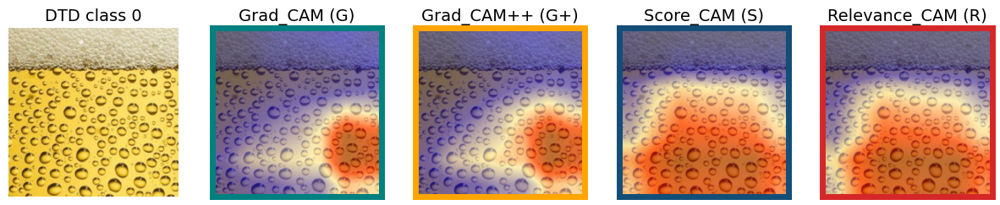

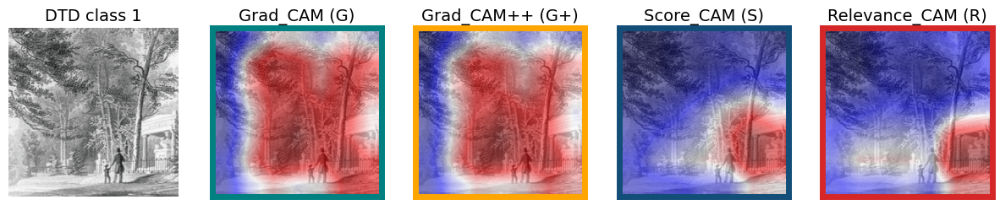

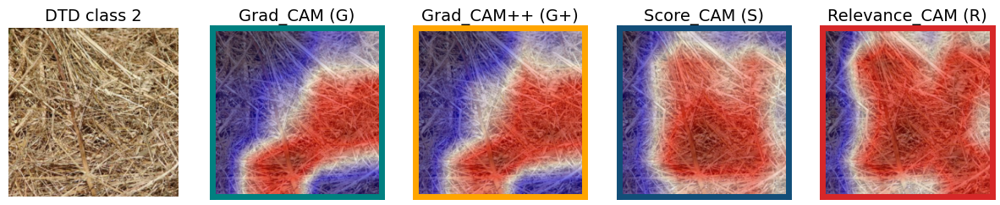

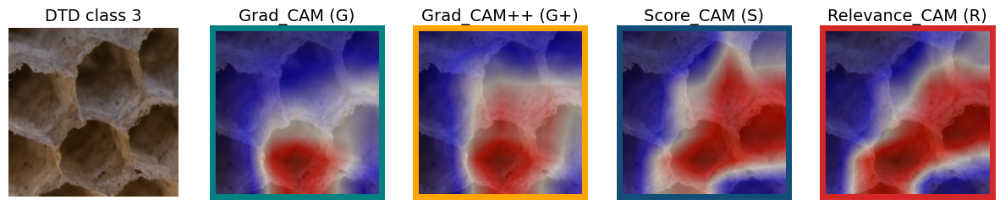

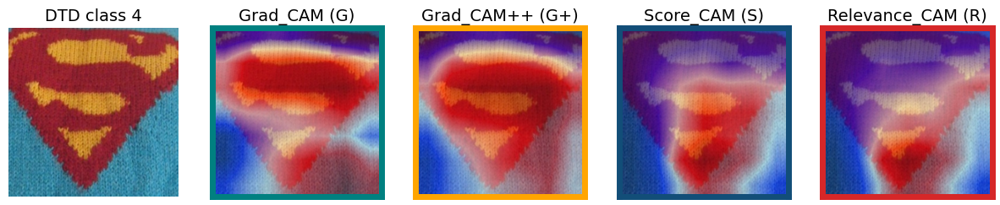

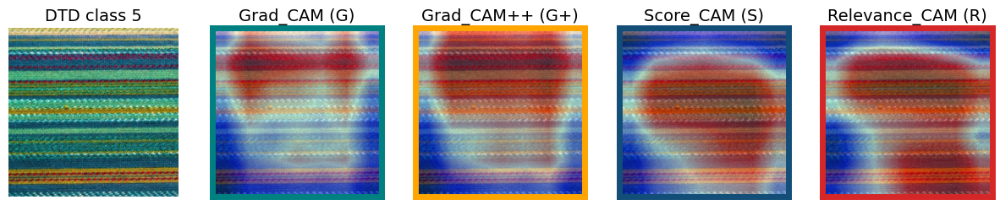

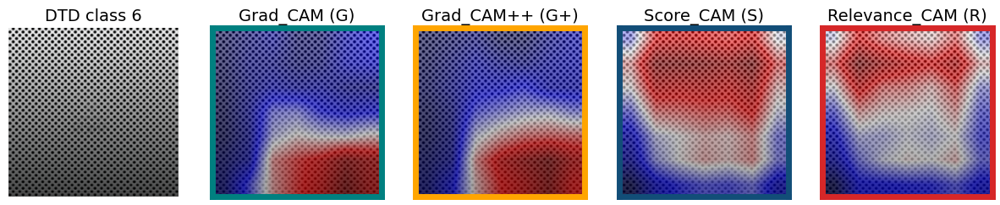

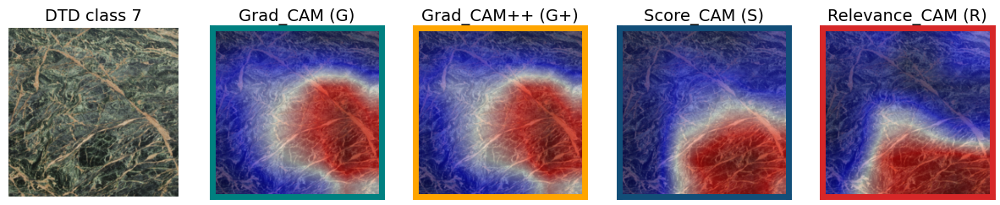

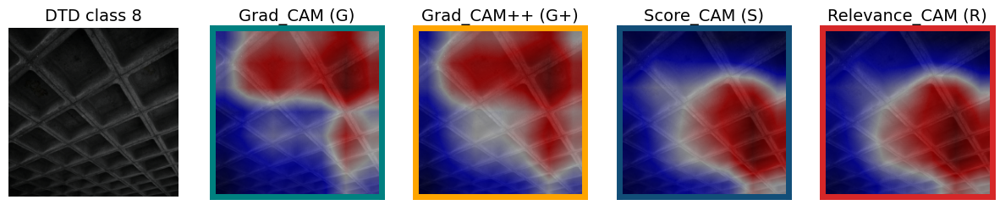

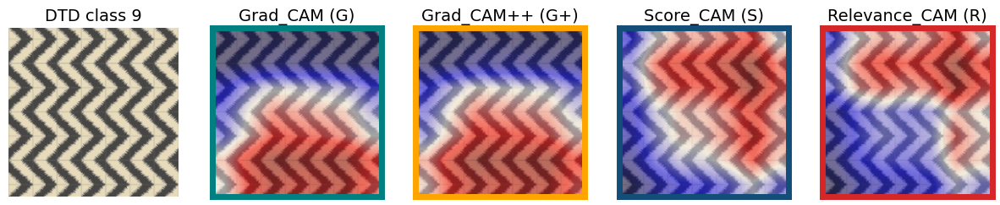

In [8]:
# Plot explanations!
index = 1
ncols = 1 + len(explanations)

for index in range(x_batch.shape[0]):
    fig, axes = plt.subplots(nrows=1, ncols=ncols, figsize=(15, int(ncols)*3))

    for i in range(ncols):

        if i == 0:
            with warnings.catch_warnings():
                image = (np.moveaxis(denormalise(x_batch[index], mean=np.array([0.485, 0.456, 0.406]), std=np.array([0.229, 0.224, 0.225])), 0, -1) * 255).astype(np.uint8)
                axes[0].imshow(image, vmin=0.0, vmax=1.0)
            if include_titles:
                axes[0].set_title(f"DTD class {y_batch[index].item()}", fontsize=14)
                axes[0].axis("off")
        
        else:
            
            xai = methods_order[i-1].split("(")[0].replace(" ", "").replace("\n", "")
            
            axes[i].imshow((explanations[xai][index].reshape(224, 224)), cmap="seismic")
            axes[i].imshow(image, alpha=.5)
            if include_titles:
                axes[i].set_title(f"{methods_order[i-1]}", fontsize=14)

            # Frame configs.
            axes[i].xaxis.set_visible([])
            axes[i].yaxis.set_visible([])
            axes[i].spines["top"].set_color(colours_order[i-1])
            axes[i].spines["bottom"].set_color(colours_order[i-1])
            axes[i].spines["left"].set_color(colours_order[i-1])
            axes[i].spines["right"].set_color(colours_order[i-1])
            axes[i].spines["top"].set_linewidth(5)
            axes[i].spines["bottom"].set_linewidth(5)
            axes[i].spines["left"].set_linewidth(5)
            axes[i].spines["right"].set_linewidth(5)

    plt.show()

In [9]:
# Load explanations.
layer = 2
explanations = {
    "Grad_CAM": [],
    "Grad_CAM++": [],
    "Score_CAM": [],
    "Relevance_CAM": [],
}
for method, batch in explanations.items():
    dir = f'data/R_CAM_results_layer{layer}/np/heatmaps/{method}/'
    files = os.listdir(dir)
    for f in files:
        file_np = np.load(dir+f)
        batch.append(file_np)

explanations = {k: np.array(v) for k, v in explanations.items()}


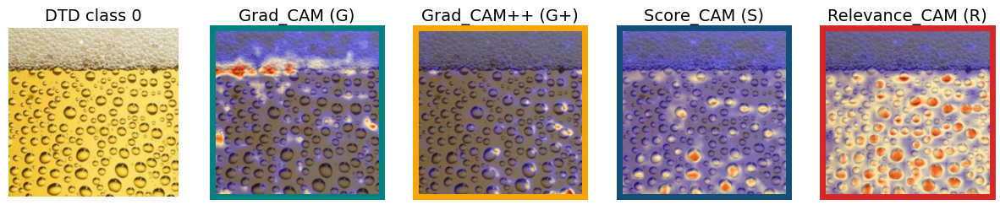

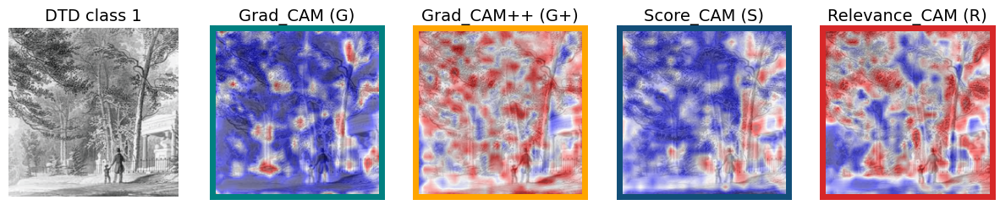

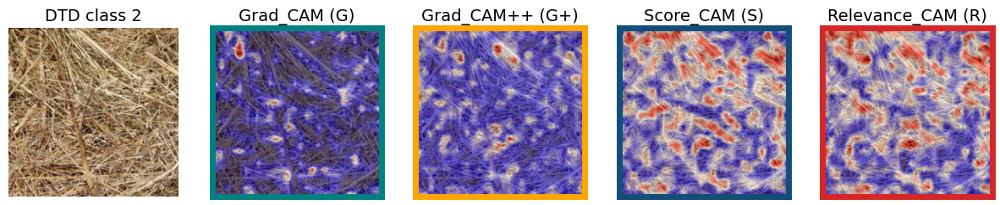

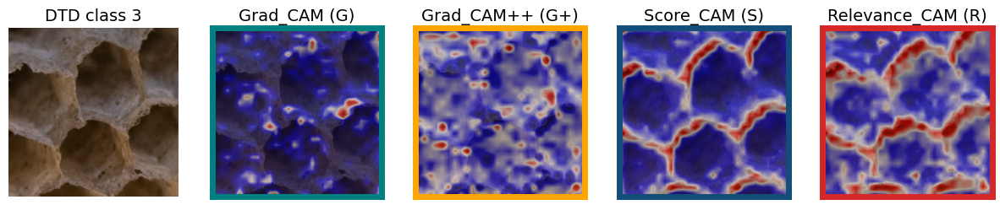

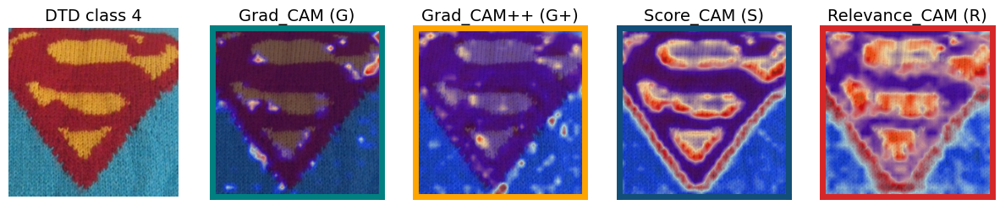

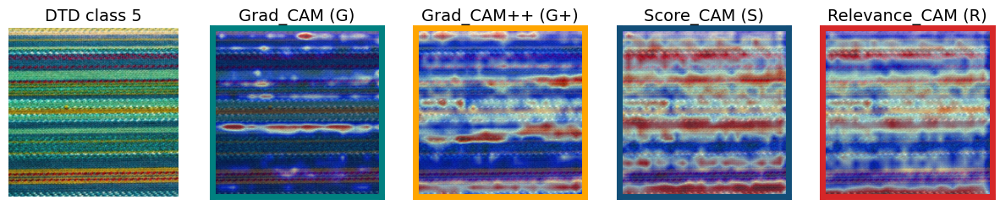

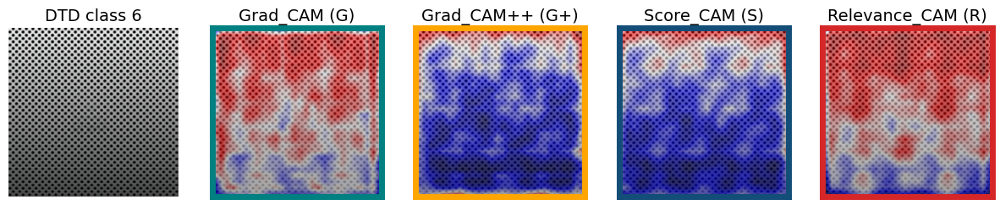

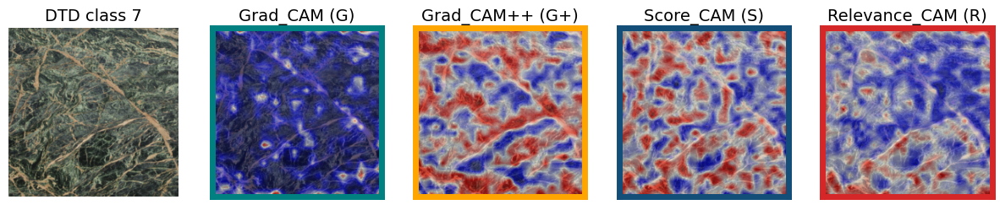

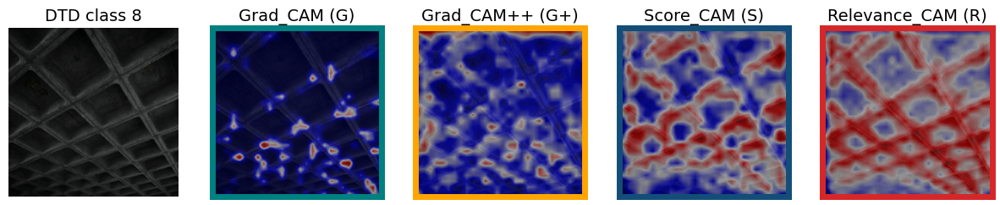

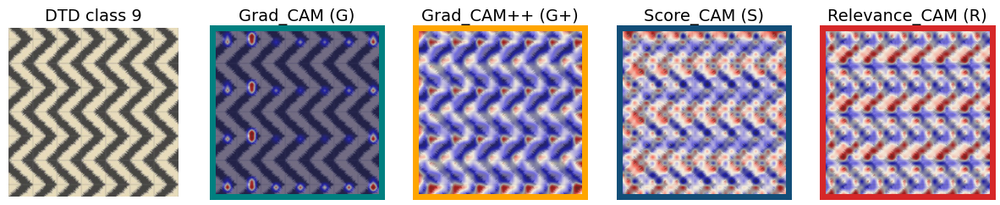

In [10]:
plt.rcParams['ytick.left'] = False
plt.rcParams['ytick.labelleft'] = False
plt.rcParams['xtick.bottom'] = False
plt.rcParams['xtick.labelbottom'] = False
include_titles = True

# Plot explanations!
index = 1
ncols = 1 + len(explanations)

for index in range(x_batch.shape[0]):
    fig, axes = plt.subplots(nrows=1, ncols=ncols, figsize=(15, int(ncols)*3))

    for i in range(ncols):

        if i == 0:
            with warnings.catch_warnings():
                image = (np.moveaxis(denormalise(x_batch[index], mean=np.array([0.485, 0.456, 0.406]), std=np.array([0.229, 0.224, 0.225])), 0, -1) * 255).astype(np.uint8)
                axes[0].imshow(image, vmin=0.0, vmax=1.0)
            if include_titles:
                axes[0].set_title(f"DTD class {y_batch[index].item()}", fontsize=14)
                axes[0].axis("off")
        
        else:
            
            xai = methods_order[i-1].split("(")[0].replace(" ", "").replace("\n", "")
            
            axes[i].imshow((explanations[xai][index].reshape(224, 224)), cmap="seismic")
            axes[i].imshow(image, alpha=.5)
            if include_titles:
                axes[i].set_title(f"{methods_order[i-1]}", fontsize=14)

            # Frame configs.
            axes[i].xaxis.set_visible([])
            axes[i].yaxis.set_visible([])
            axes[i].spines["top"].set_color(colours_order[i-1])
            axes[i].spines["bottom"].set_color(colours_order[i-1])
            axes[i].spines["left"].set_color(colours_order[i-1])
            axes[i].spines["right"].set_color(colours_order[i-1])
            axes[i].spines["top"].set_linewidth(5)
            axes[i].spines["bottom"].set_linewidth(5)
            axes[i].spines["left"].set_linewidth(5)
            axes[i].spines["right"].set_linewidth(5)

    plt.show()